# complex image manuplation --> computer vision 

Inverted Images   
Rescaling    
Binarization   
Noise Removal   
Dilation and Erosion   
Rotation / Deskewing   
Removing Borders   
Missing Borders   
Transparency / Alpha Channel    

# open an image

In [1]:
import cv2 

img_file = "data/1.jpg"
img = cv2.imread(img_file)

In [2]:
cv2.imshow("org img",img)
cv2.waitKey(0)

-1

# to display img in  jupyter 

In [3]:
#displaying-different-images-with-actual-size-in-matplotlib-subplot
import matplotlib.pyplot as plt 

def display(im_path):

    dpi = 80     # dots per inch (DPI) <------------------

    #  This value controls the resolution when the figure is displayed.  
   #  It is used to compute the figure size in inches, based on image pixels.

    im_data = plt.imread(im_path)
    height, width  = im_data.shape[:2]
    
    # What size does the figure need to be in inches to fit the image?
    figsize = width / float(dpi)  ,  height / float(dpi)

    # Create a figure of the right size with one axes that takes up the full figure
    fig = plt.figure(figsize = figsize)

    # The list [0, 0, 1, 1] specifies [left, bottom, width, height] in normalized figure coordinates (from 0 to 1).
    ax = fig.add_axes([0, 0, 1, 1])

    # Hide spines, ticks, etc , Hides the axis borders, ticks, and labels — gives a clean view of the image.
    ax.axis('off')

    # Display the image.
    ax.imshow(im_data, cmap='gray')

    plt.show()

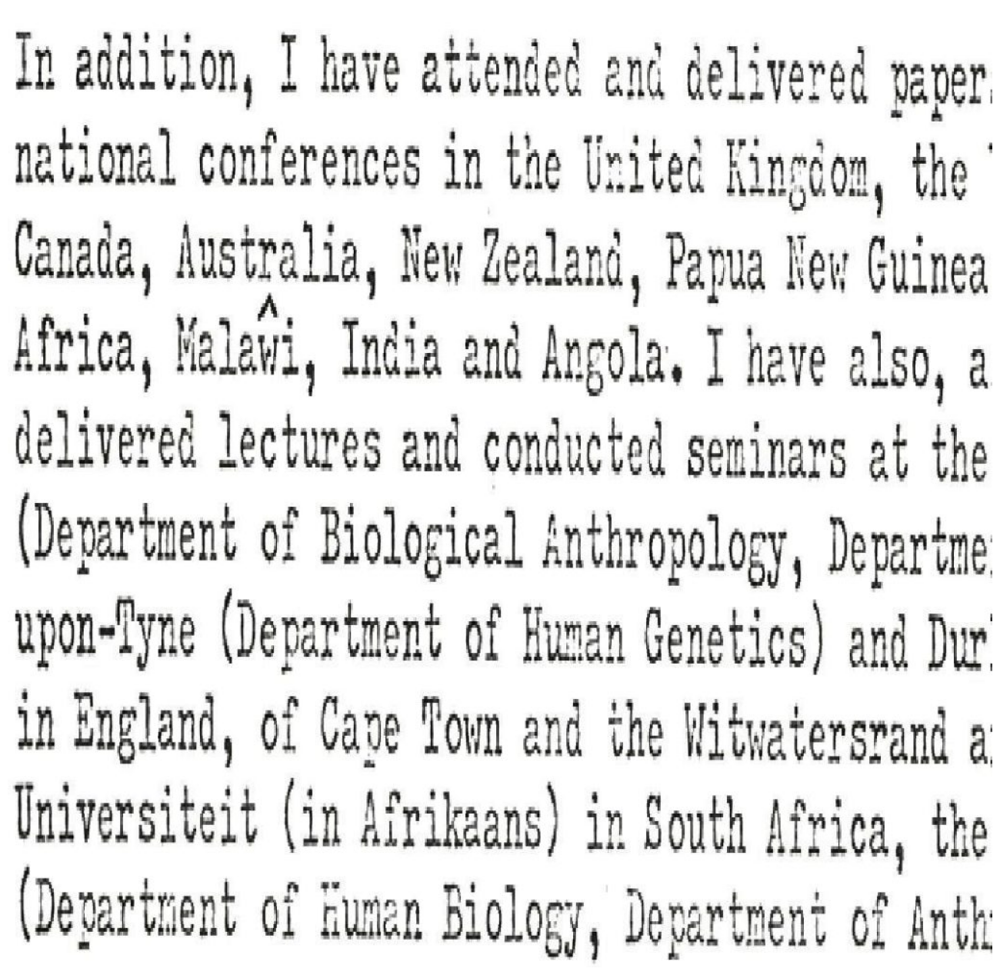

In [4]:
display(img_file)

# 01: Inverted Images

In [5]:
# to get optimal way of training process for images <-- inverted imgs 

inverted_image = cv2.bitwise_not(img)
cv2.imwrite('data/1_inverted_img.jpg',inverted_image)

True

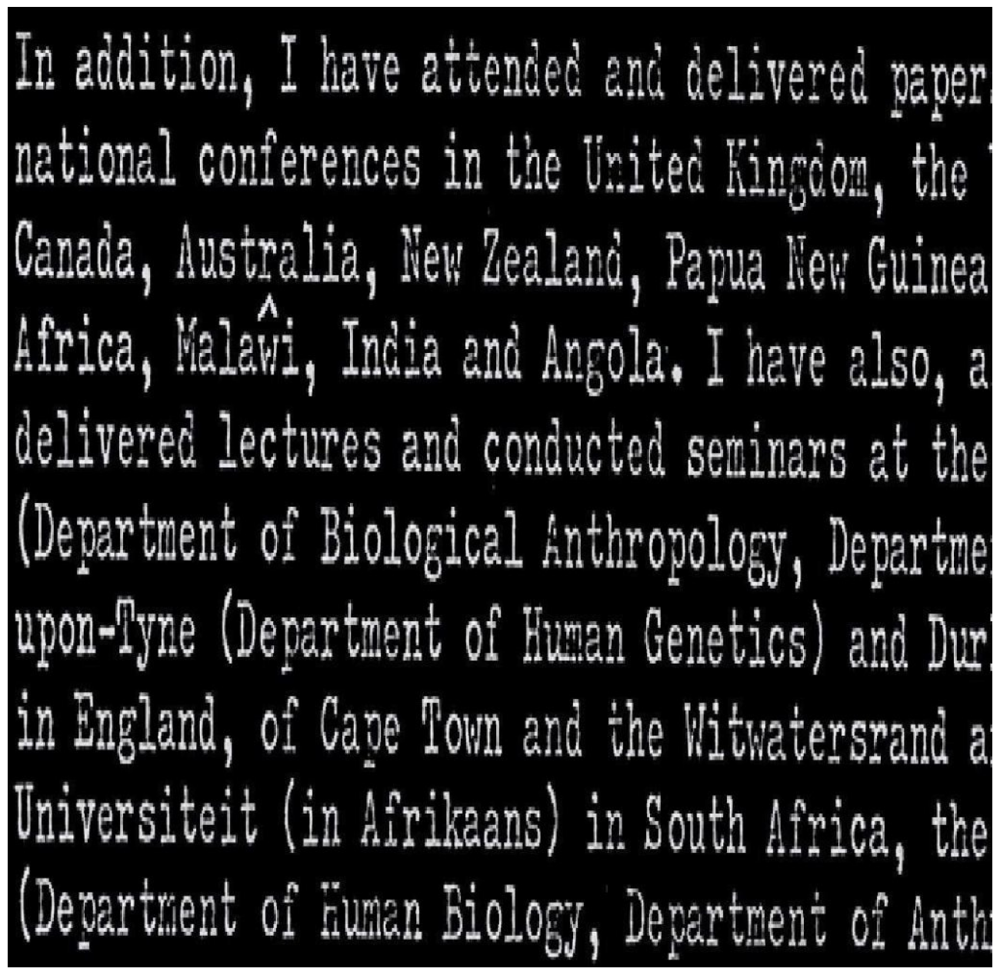

In [6]:
display("data/1_inverted_img.jpg") 

# 02: Rescaling

# 03: Binarization

In [7]:
# gray scale img ( allow process lot more easily )  --> binarize 

def grayscale(img):
    return cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

In [8]:
gray_image =  grayscale(img)
cv2.imwrite("data/1_gray_scale_img.jpg", gray_image)

True

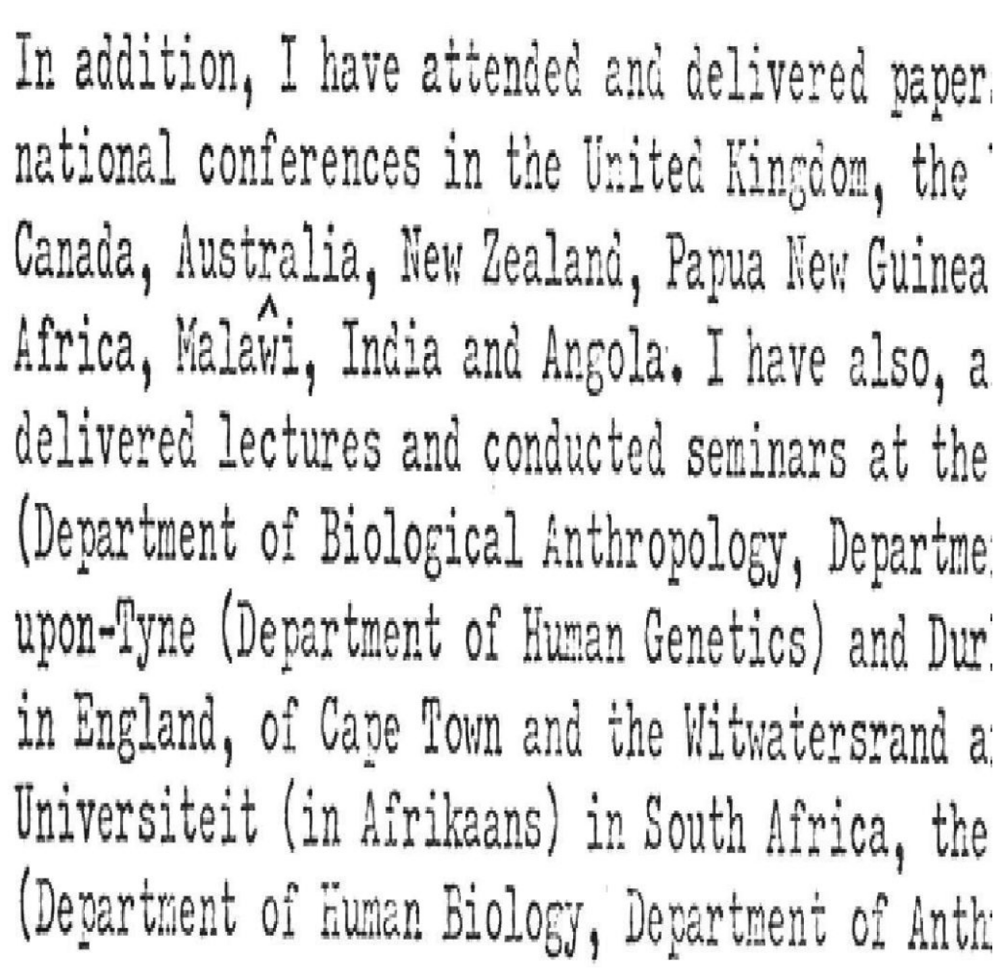

In [9]:
display("data/1_gray_scale_img.jpg")

In [10]:
# implementing binarization

thresh, im_bw = cv2.threshold(gray_image , 210 , 255 , cv2.THRESH_BINARY)
cv2.imwrite("data/1_black_white_binary.jpg" , im_bw)

True

# by adjusting threshold we can use correct readable format 

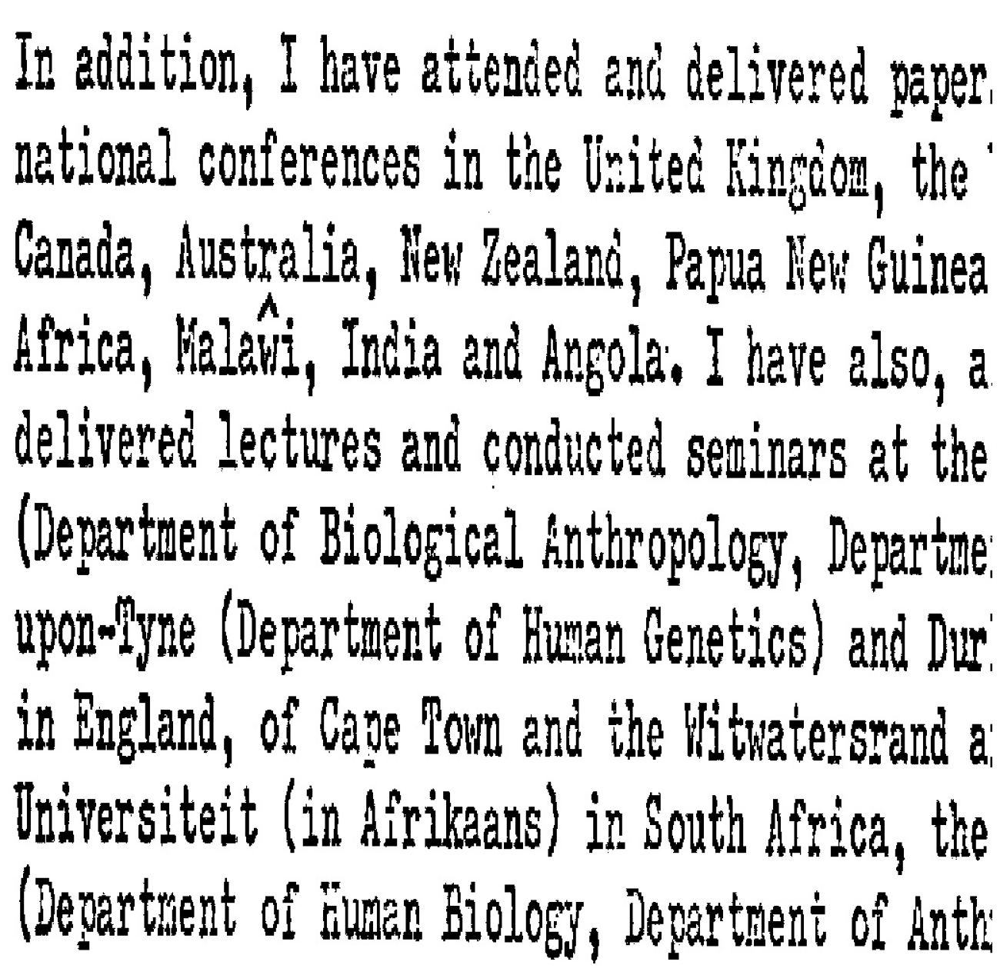

In [11]:
display("data/1_black_white_binary.jpg")

# by adjusting  u will have remove the noise 

# 04: Noise Removal

In [12]:
import numpy  as np 

def  noise_removal(img):

    kernel = np.ones((1 , 1, ) , np.uint8)
    #  Creates a **1×1 kernel** (tiny matrix filled with 1s) of type `np.uint8` (8-bit unsigned int).  
    #   - This is used as a structuring element for morphological operations (like dilation and erosion).

    img = cv2.dilate(img, kernel, iterations= 1 )  # Thickens the white (foreground) regions
    # Dilates the white regions in the image. Expands white areas — useful for connecting broken parts of characters or lines in binary images.


    # another kernel 
    kernel = np.ones((1,1) , np.uint8)  
    img = cv2.erode(img , kernel , iterations = 1)   # Thins the white (foreground) regions
    # Erodes the white areas — opposite of dilation. Removes small white noises, especially helpful after dilation to balance the result.


    img = cv2.morphologyEx(img, cv2.MORPH_CLOSE , kernel)
#     - Applies **morphological closing**: Dilation followed by erosion.
#   - Fills small holes inside white regions — useful for smoothing character blobs.
#   - Helps clean up **gaps or small black holes** inside letters like "O", "B", etc.


    img = cv2.medianBlur(img, 3) # with kernel size  = 3 
    return img 


In [13]:
no_noise = noise_removal(im_bw)
cv2.imwrite('data/1_no_noise.jpg',no_noise)

True

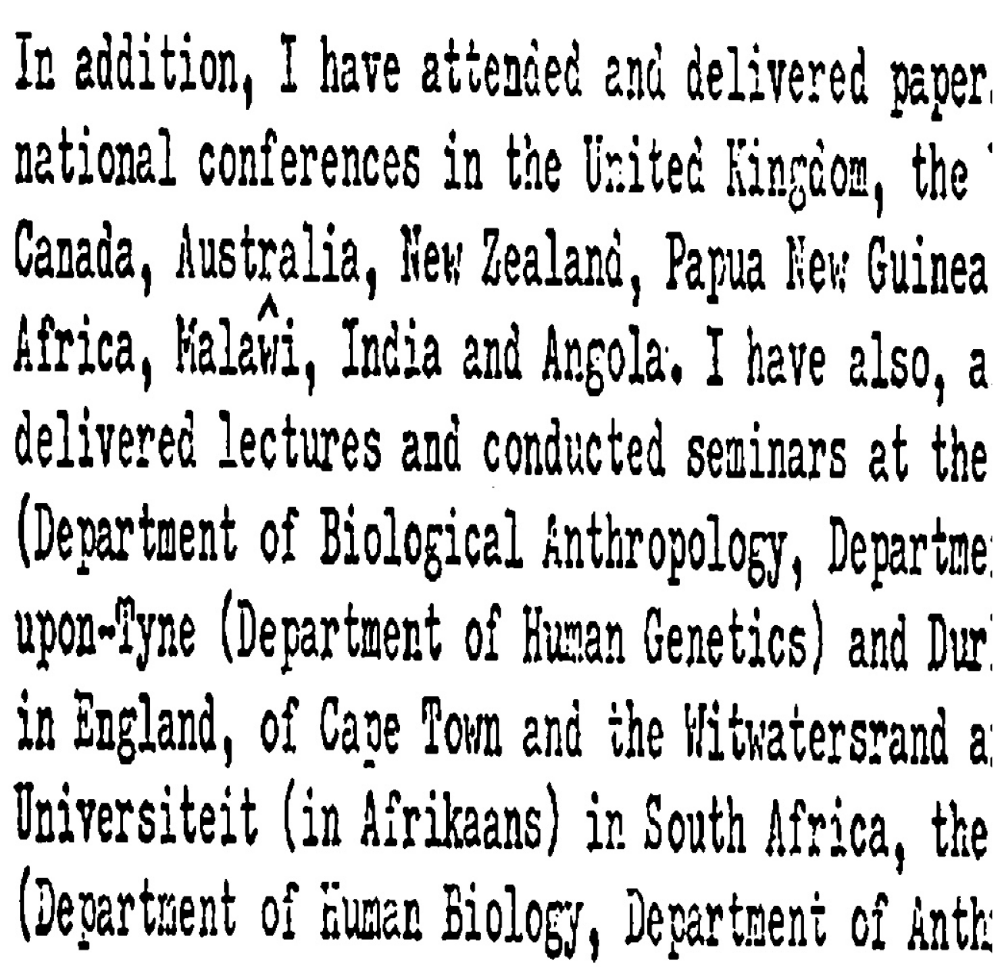

In [14]:
display('data/1_no_noise.jpg')

In [15]:
# make some bold characters  and remove noise -->  if u see around some dullness some dots near characters 

# 5 Dilation and Erosion 

In [16]:
def thin_font(img):  # erode 

    img =  cv2.bitwise_not(img)  # invert the img 
    kernel =  np.ones((2,2) ,np.uint8 )
    img = cv2.erode(img, kernel , iterations= 1)

    img = cv2.bitwise_not(img)
    
    return img

In [17]:
eroded_image = thin_font(no_noise)
cv2.imwrite("data/1_eroded_image.jpg", eroded_image)

True

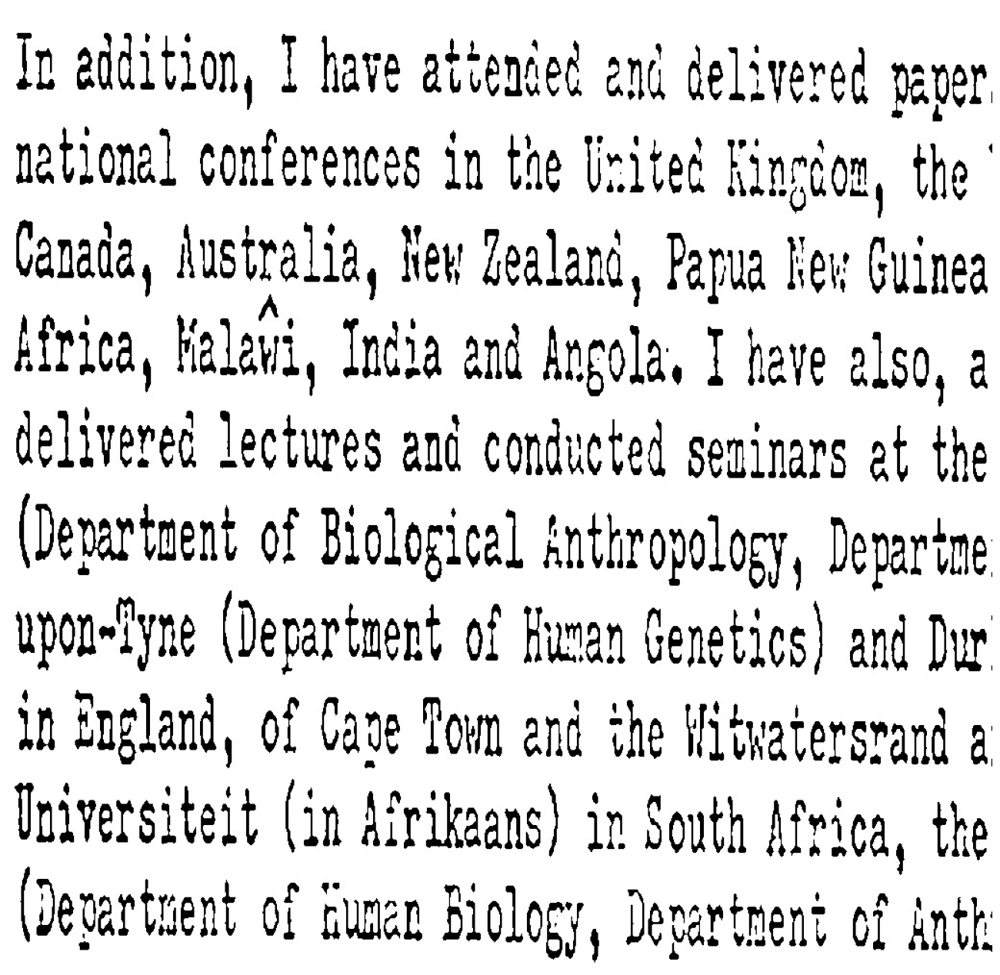

In [18]:
display("data/1_eroded_image.jpg")

In [19]:
def thick_font(image):  # dilation 
    
    image = cv2.bitwise_not(image)
    kernel = np.ones((2,2),np.uint8)
    image = cv2.dilate(image, kernel, iterations=1)

    image = cv2.bitwise_not(image)

    return (image)

In [20]:
dilated_img = thick_font(no_noise)
cv2.imwrite("data/1_dilated_img.jpg", dilated_img)


True

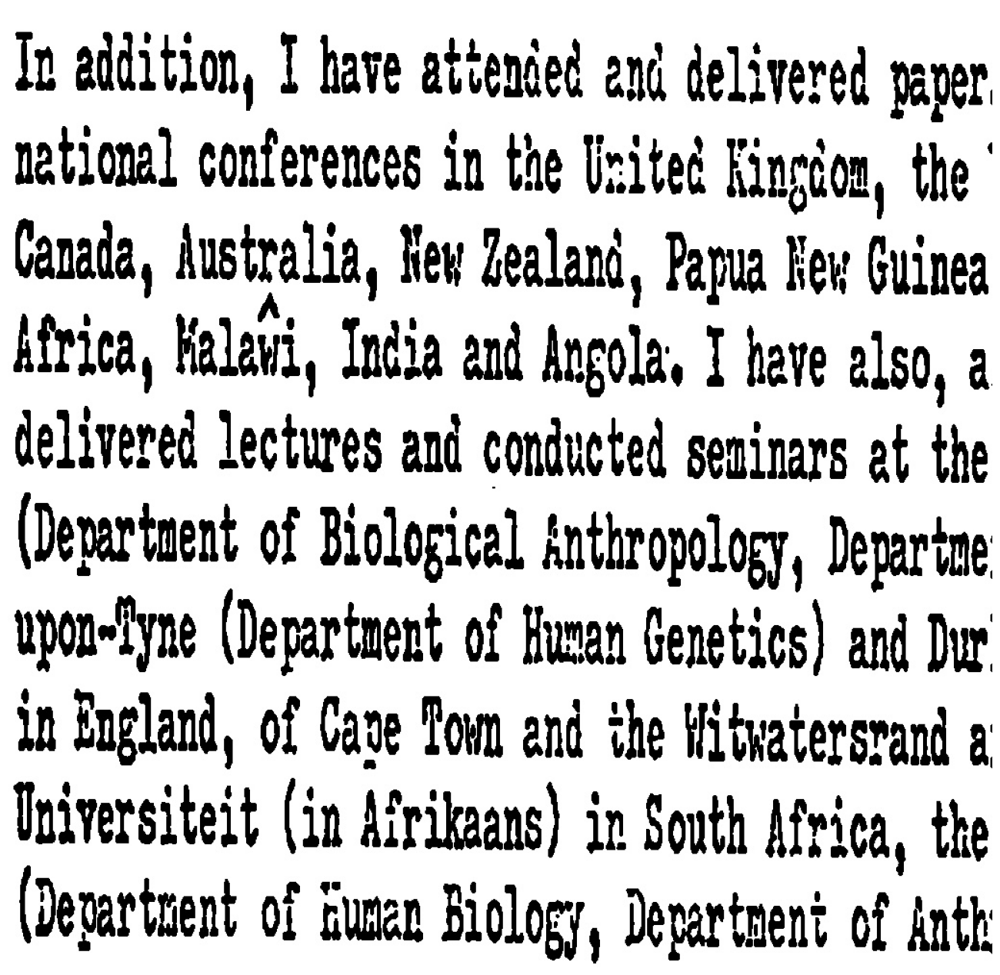

In [21]:
display('data/1_dilated_img.jpg')

# first remove borders 

#   06: Rotation / Deskewing

In [22]:
# taking our own img from starting 

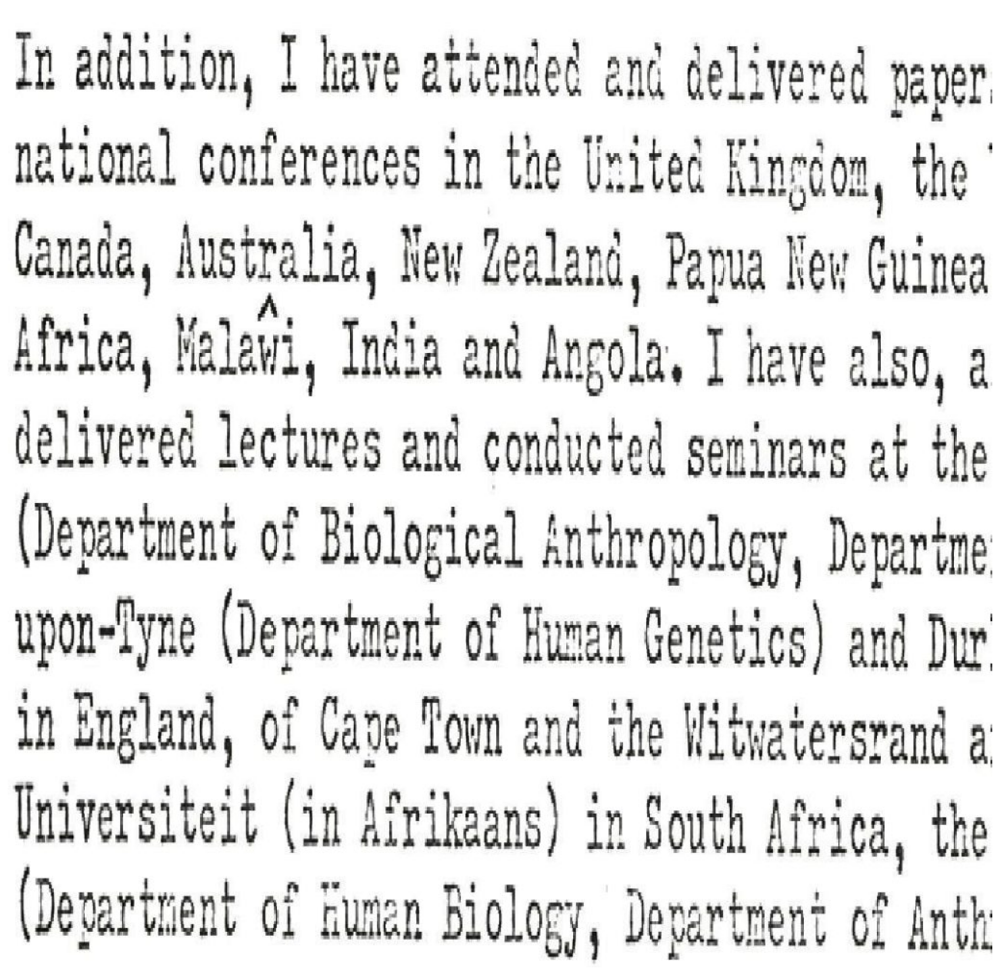

In [23]:
new = cv2.imread('data/1.jpg')
display('data/1.jpg')

In [24]:
#https://becominghuman.ai/how-to-automatically-deskew-straighten-a-text-image-using-opencv-a0c30aed83df
import numpy as np

def getSkewAngle(cvImage) -> float:
    #1 ---------------------------------------------------
    # Prep image, copy, convert to -- > gray scale, blur, and threshold(ostu)

    newImage = cvImage.copy()
    gray = cv2.cvtColor(newImage, cv2.COLOR_BGR2GRAY)
    blur = cv2.GaussianBlur(gray, (9, 9), 0)
    # Otsu's thresholding.
    thresh = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]
    #-----------------------------------------------------

    #2
    # Apply dilate to merge text into meaningful lines/paragraphs. ------------

    # Use larger kernel on X axis to merge characters into single line, cancelling out any spaces.
    # But use smaller kernel on Y axis to separate between different blocks of text

    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (30, 5))
    # Creates a rectangular kernel: 30 pixels wide and 5 pixels tall.
    # Helps connect characters in horizontal lines but still separates vertically.

    dilate = cv2.dilate(thresh, kernel, iterations=2)
    
      
    # Find all contours
    contours, hierarchy = cv2.findContours(dilate, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)

    contours = sorted(contours, key = cv2.contourArea, reverse = True)

    for c in contours:
        rect = cv2.boundingRect(c)
        x,y,w,h = rect
        cv2.rectangle(newImage,(x,y),(x+w,y+h),(0,255,0),2) 


    # Find largest contour and surround in min area box
    largestContour = contours[0]
    print (len(contours))

    minAreaRect = cv2.minAreaRect(largestContour)
    # Fits the minimum-area rotated rectangle around the contour.
    # Returns a rotated rectangle (center, (width, height), angle).
    cv2.imwrite("data/bboxes.jpg", newImage)


    # Determine the angle. Convert it to the value that was originally used to obtain skewed image
    angle = minAreaRect[-1]
    if angle < -45:
        angle = 90 + angle
    return -1.0 * angle


# Rotate the image around its center
def rotateImage(cvImage, angle: float):
    newImage = cvImage.copy()
    (h, w) = newImage.shape[:2]
    center = (w // 2, h // 2)

    M = cv2.getRotationMatrix2D(center, angle, 1.0)
    # Gets the 2D rotation matrix for rotating around the center by angle with no scaling (1.0).
    
    newImage = cv2.warpAffine(newImage, M, (w, h), flags=cv2.INTER_CUBIC, borderMode=cv2.BORDER_REPLICATE)
    # Applies the rotation transformation using warpAffine.
    # INTER_CUBIC: High-quality interpolation.
    # BORDER_REPLICATE: Extends the border pixels to fill corners.


    return newImage

In [25]:
# Deskew image
def deskew(cvImage):
    
    angle = getSkewAngle(cvImage)
    return rotateImage(cvImage, -1.0 * angle)

In [26]:
fixed = deskew(new)
cv2.imwrite("data/6_rotated_fixed.jpg", fixed)

13


True

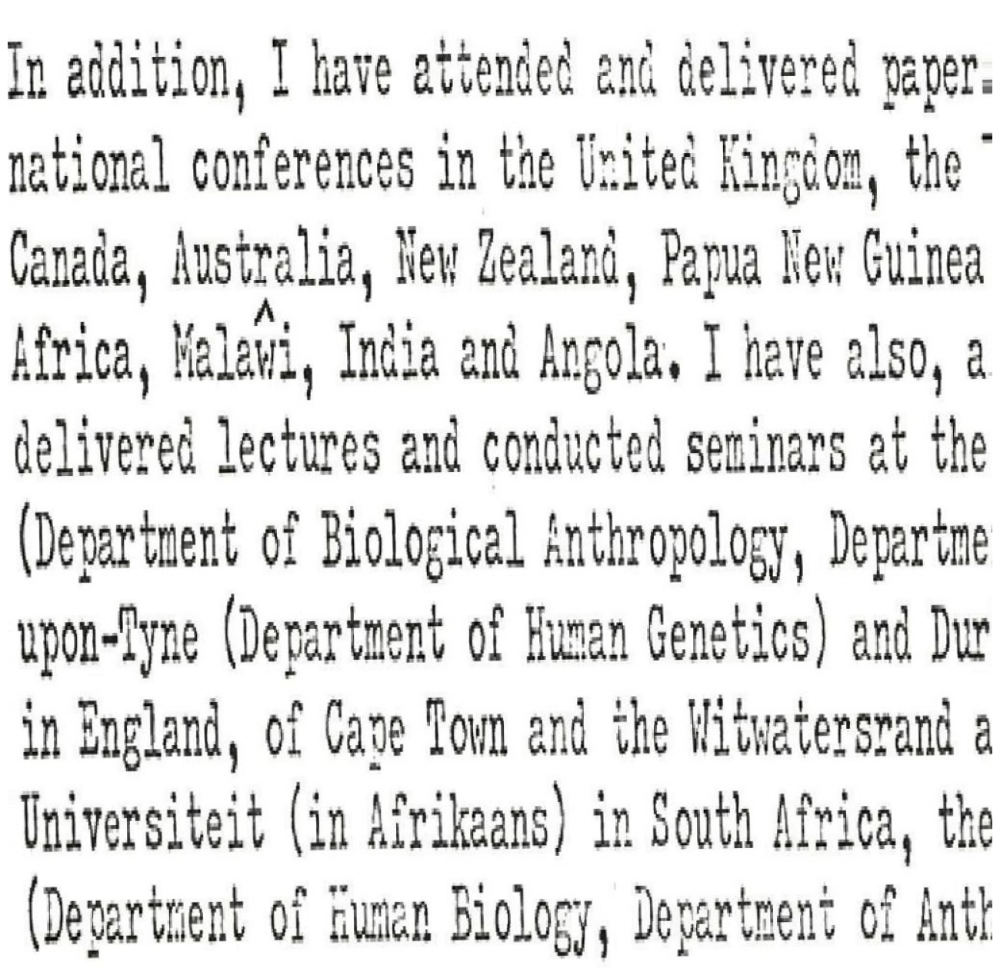

In [27]:
display('data/6_rotated_fixed.jpg')

# 7 Removing Borders 

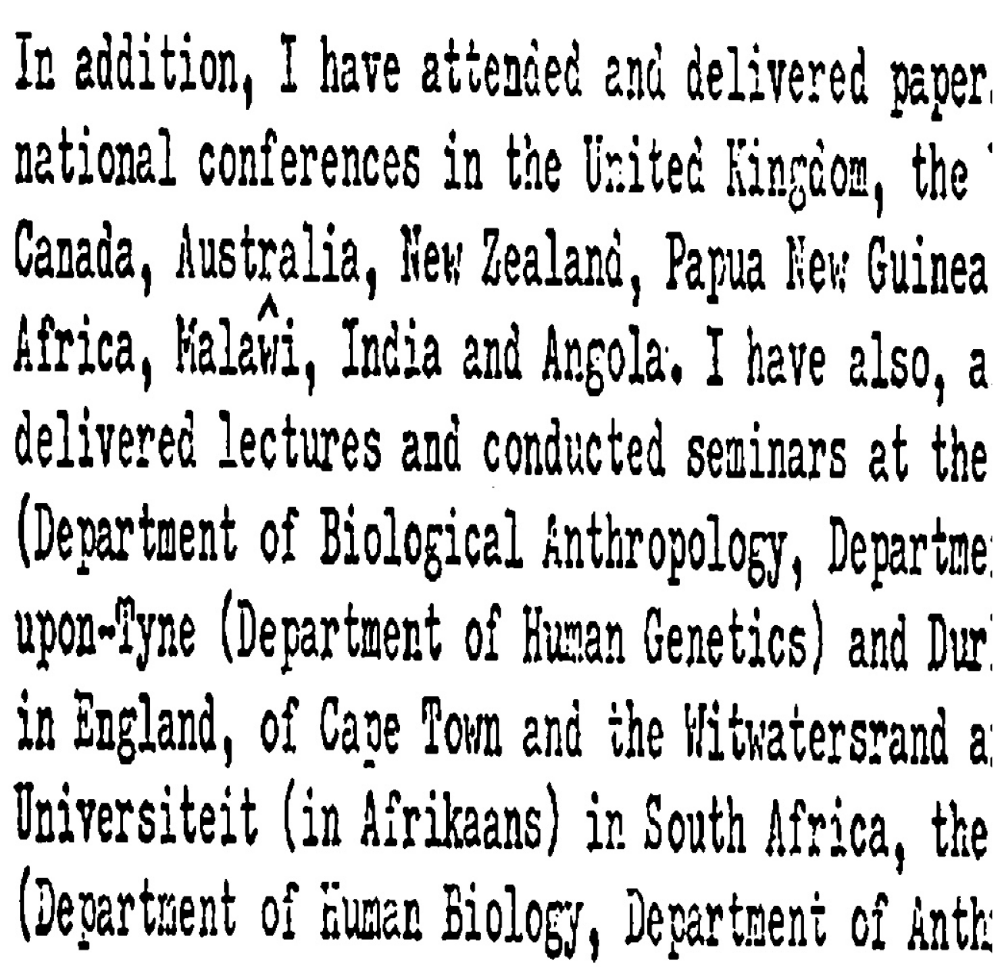

In [28]:
display('data/1_no_noise.jpg')

In [29]:
def remove_borders(image):

    contours, heiarchy = cv2.findContours(image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    cntsSorted = sorted(contours, key=lambda x:cv2.contourArea(x))

    cnt = cntsSorted[-1]   # largest  
    x, y, w, h = cv2.boundingRect(cnt)

    crop = image[y:y+h, x:x+w]  #cropping
    return (crop)

In [30]:
no_borders = remove_borders(no_noise)
cv2.imwrite("data/1_no_borders.jpg", no_borders)
 

True

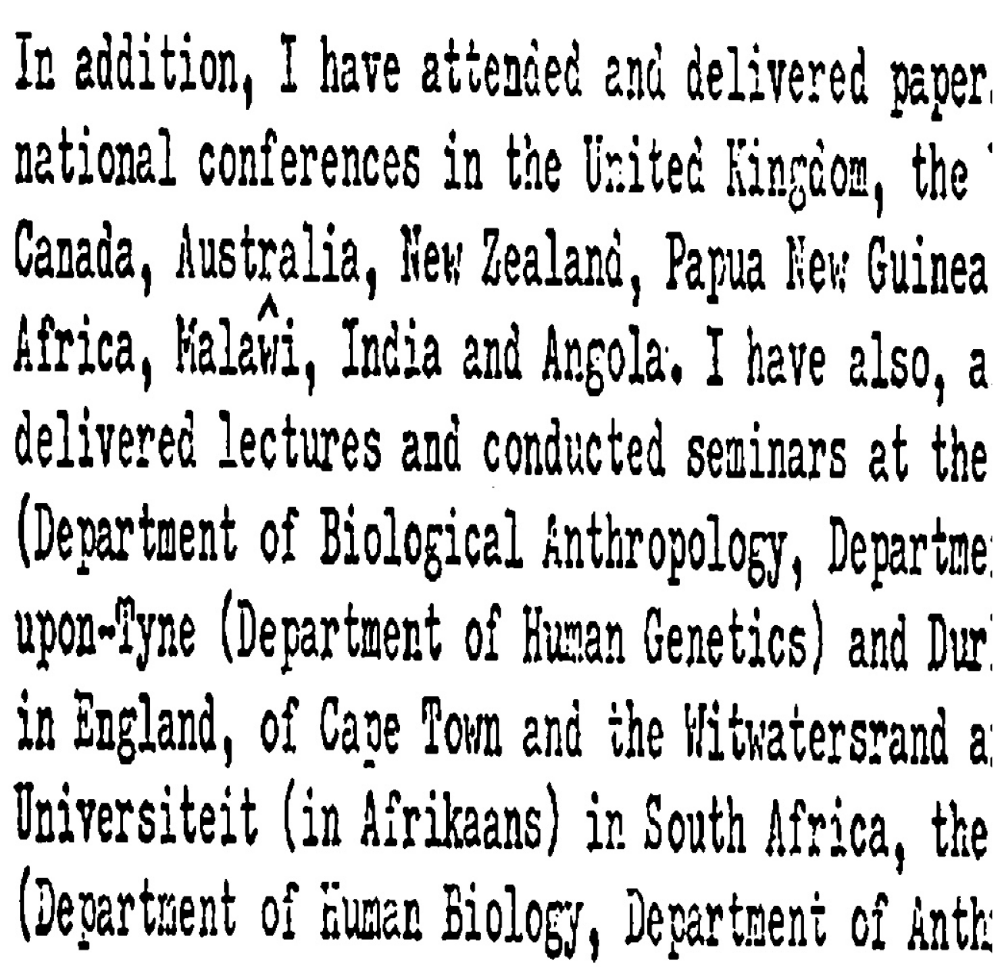

In [31]:
display('data/1_no_borders.jpg')

# 8 Adding Missing Borders

In [32]:
# if some text borders are missed when cropped

color = [0,255,0]
top, bottom, left, right = [150]*4

In [33]:
image_with_border = cv2.copyMakeBorder(no_borders  , top, bottom, left, right, cv2.BORDER_CONSTANT, value=color) #  black color 
cv2.imwrite("data/image_with_border.jpg", image_with_border)
 


True

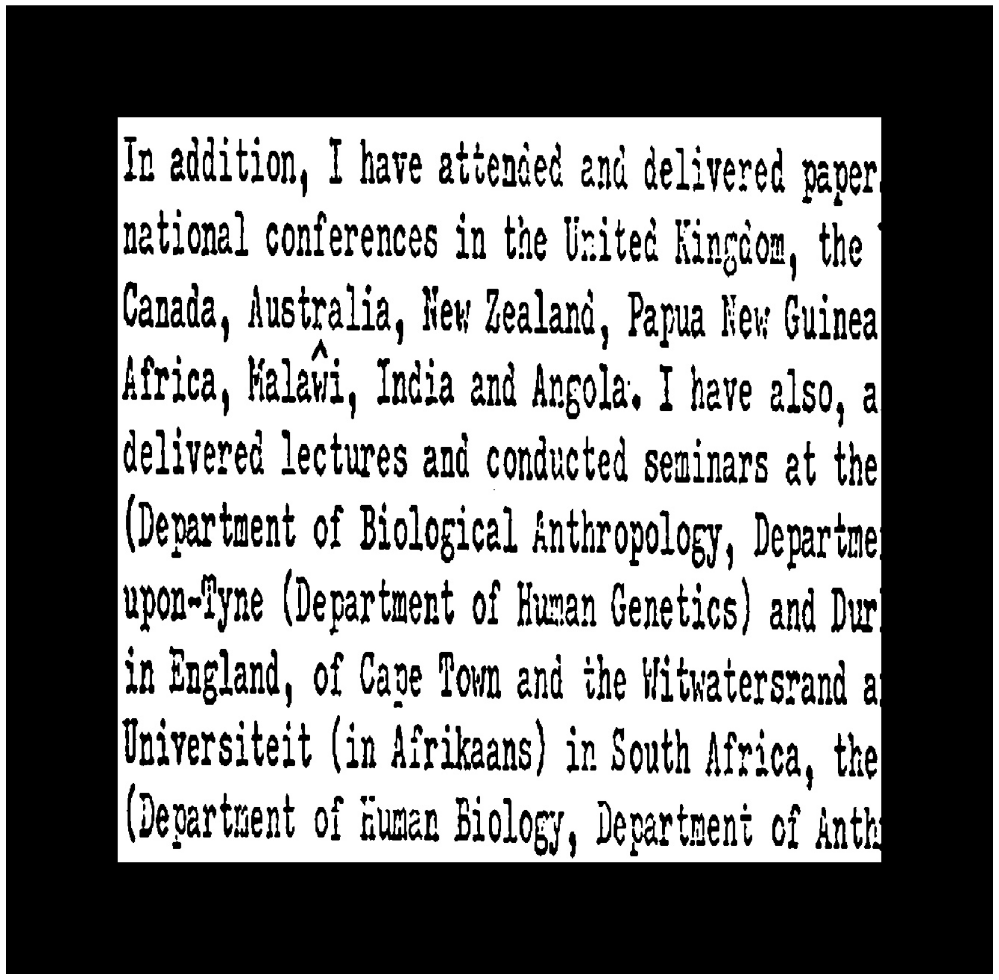

In [34]:
display("data/image_with_border.jpg")

# 9 transparency /alpha channels

In [35]:
# it will be problem when we use   --->     png  files 